[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/paulnovello/Advanced-AI/blob/main/PP6%3A%SSL/ssl_part3_mae_dino.ipynb)
# Notebook 3 — Exploring Pre-trained MAE & DINOv2

## From Training to Exploring Foundation Models

In Notebooks 1 and 2, we trained SSL models **from scratch** on CIFAR-10 with a small CNN. We saw the progression:

$$\text{Pretext tasks} \xrightarrow{\text{better objective}} \text{SimCLR} \xrightarrow{\text{better scale}} \text{Foundation models}$$

Now we shift gears: instead of *training* models, we will **explore pre-trained foundation models** and understand *what they have learned*. These models (MAE, DINOv2) were trained on millions of images with large ViT architectures — the same principles we learned, but at massive scale.

---

### What We Will Explore

| Model | What we'll do | Key question |
|---|---|---|
| **MAE** (He et al., 2022) | Visualize reconstructions from masked inputs | What does the model "fill in" — texture or semantics? |
| **MAE** | Compare masking ratios | Why is 75% the sweet spot? |
| **MAE** | Linear probe on CIFAR-10 | Does pixel reconstruction produce good features? |
| **DINOv2** (Oquab et al., 2023) | Attention map visualization | Do attention heads segment objects? |
| **DINOv2** | PCA on patch features | Is there semantic structure at the patch level? |
| **DINOv2** | k-NN classification | How good are frozen features — with no training at all? |
| **DINOv2 vs Supervised ViT** | Attention comparison | What does self-supervision learn differently? |

---

**Duration:** ~40 minutes  
**Hardware:** GPU recommended (T4 is sufficient)  
**Models:** Pre-trained ViT-MAE and DINOv2 from HuggingFace / PyTorch Hub

---
## Section 0 — Setup

In [41]:
# !pip install -q torch torchvision transformers matplotlib scikit-learn tqdm pillow

In [42]:
!wget -O cat.jpg "https://upload.wikimedia.org/wikipedia/commons/thumb/4/4d/Cat_November_2010-1a.jpg/1200px-Cat_November_2010-1a.jpg"
!sleep 5
!wget -O dog.jpg "https://upload.wikimedia.org/wikipedia/commons/thumb/2/26/YellowLabradorLooking_new.jpg/1200px-YellowLabradorLooking_new.jpg"
!sleep 5
!wget -O parrot.jpg "https://upload.wikimedia.org/wikipedia/commons/thumb/6/65/Amazona_albifrons_-upper_body_of_pet.jpg/1920px-Amazona_albifrons_-upper_body_of_pet.jpg"
!sleep 5
!wget -O car.jpg "https://upload.wikimedia.org/wikipedia/commons/e/e5/Fiat_500_in_Emilia-Romagna.jpg"

--2026-03-22 14:44:43--  https://upload.wikimedia.org/wikipedia/commons/thumb/4/4d/Cat_November_2010-1a.jpg/1200px-Cat_November_2010-1a.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.240, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 490372 (479K) [image/jpeg]
Saving to: ‘cat.jpg’

cat.jpg             100%[===================>] 478.88K  --.-KB/s    in 0.09s   

2026-03-22 14:44:43 (5.24 MB/s) - ‘cat.jpg’ saved [490372/490372]

--2026-03-22 14:44:48--  https://upload.wikimedia.org/wikipedia/commons/thumb/2/26/YellowLabradorLooking_new.jpg/1200px-YellowLabradorLooking_new.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.240, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252168 (246K) [image/jpeg]
Saving t

In [43]:
# --- Imports ---
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
import torchvision.transforms as T
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.manifold import TSNE
from tqdm.auto import tqdm
from PIL import Image

# Reproducibility
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

# Device
if torch.cuda.is_available():
    device = torch.device("cuda")
elif hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")

print(f"Using device: {device}")
if device.type == "cuda":
    print(f"GPU: {torch.cuda.get_device_name(0)}")

CIFAR10_CLASSES = ['airplane', 'automobile', 'bird', 'cat', 'deer',
                   'dog', 'frog', 'horse', 'ship', 'truck']

Using device: cuda
GPU: Tesla T4


Loaded 4 images: Cat, Dog, Parrot, Car


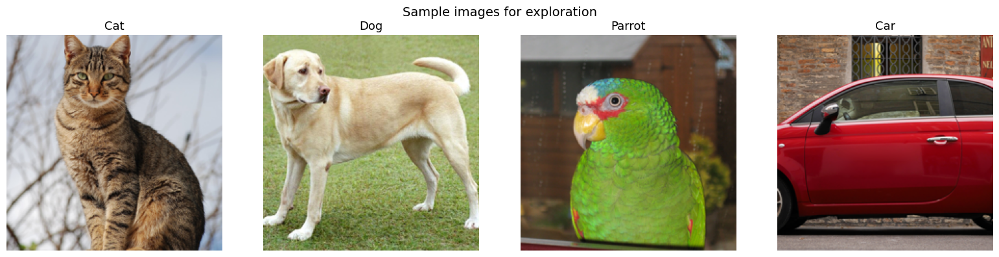

In [44]:
# --- Load the downloaded sample images ---

sample_files = [
    ("cat.jpg", "Cat"),
    ("dog.jpg", "Dog"),
    ("parrot.jpg", "Parrot"),
    ("car.jpg", "Car"),
]

sample_images = []
sample_names = []
for filename, name in sample_files:
    img = Image.open(filename).convert("RGB")
    # Center crop to square, then resize to 224x224
    w, h = img.size
    s = min(w, h)
    img = img.crop(((w - s) // 2, (h - s) // 2, (w + s) // 2, (h + s) // 2))
    img = img.resize((224, 224), Image.BICUBIC)
    sample_images.append(img)
    sample_names.append(name)

print(f"Loaded {len(sample_images)} images: {', '.join(sample_names)}")

# Display
fig, axes = plt.subplots(1, len(sample_images), figsize=(4 * len(sample_images), 4))
for ax, img, name in zip(axes, sample_images, sample_names):
    ax.imshow(img)
    ax.set_title(name, fontsize=13)
    ax.axis("off")
fig.suptitle("Sample images for exploration", fontsize=14)
plt.tight_layout()
plt.show()

---
## Part A — Masked Autoencoders (MAE)

### The idea

MAE (He et al., CVPR 2022) trains a Vision Transformer by masking a large fraction of image patches and learning to **reconstruct the missing pixels**.

$$\text{Image} \xrightarrow{\text{mask 75\%}} \text{Visible patches only} \xrightarrow{\text{ViT encoder}} \text{Latent repr.} \xrightarrow{\text{Lightweight decoder}} \text{Reconstructed image}$$

### Why 75% masking?

The masking ratio is critical. With too little masking (e.g., 25%), the model can reconstruct by **local interpolation** — just averaging neighboring patches. With 75% masking, the model must develop a **global understanding** of the image to fill in the missing content.

### Key architectural insight

MAE is **asymmetric**: the encoder only processes **visible patches** (25% of the total), making it very efficient. The decoder is lightweight and only used during pre-training — it is discarded for downstream tasks.

| Component | Size | Processes |
|---|---|---|
| **Encoder** (ViT-Base) | 86M params | Only visible patches (25%) |
| **Decoder** (small ViT) | 8M params | All patches (visible + mask tokens) |

Let's load a pre-trained MAE and see what it reconstructs.

### A.1 — Load pre-trained MAE

We use `facebook/vit-mae-base` from HuggingFace — a ViT-Base (patch size 16) pre-trained on ImageNet with 75% masking.

In [45]:
from transformers import ViTMAEForPreTraining, ViTMAEConfig

# Load pre-trained MAE (ViT-Base, patch size 16, trained on ImageNet)
mae_model = ViTMAEForPreTraining.from_pretrained("facebook/vit-mae-base").to(device)
mae_model.eval()

print(f"MAE model loaded: {sum(p.numel() for p in mae_model.parameters()) / 1e6:.1f}M parameters")
print(f"Patch size: {mae_model.config.patch_size}")
print(f"Image size: {mae_model.config.image_size}")
print(f"Default mask ratio: {mae_model.config.mask_ratio}")

Loading weights:   0%|          | 0/334 [00:00<?, ?it/s]

MAE model loaded: 111.9M parameters
Patch size: 16
Image size: 224
Default mask ratio: 0.75


### A.2 — Mask and reconstruct images

We'll feed our sample images through MAE and visualize four things:
1. **Original** — the input image
2. **Masked** — the image with 75% of patches grayed out (what the encoder sees)
3. **Reconstruction** — original patches for visible regions + predicted patches for masked regions
4. **Full prediction** — the model's prediction for all patches (including visible ones)

The reconstruction quality tells us what the model has learned about image structure.

In [46]:
# --- MAE preprocessing ---

from transformers import ViTImageProcessor

mae_processor = ViTImageProcessor.from_pretrained("facebook/vit-mae-base")


def mae_reconstruct(model, processor, pil_image, mask_ratio=0.75):
    """Run MAE forward pass: mask patches, reconstruct, and return visualization data."""
    inputs = processor(images=pil_image, return_tensors="pt").to(device)
    pixel_values = inputs["pixel_values"]  # (1, 3, 224, 224)

    original_ratio = model.config.mask_ratio
    model.config.mask_ratio = mask_ratio

    with torch.no_grad():
        outputs = model(**inputs)

    model.config.mask_ratio = original_ratio

    logits = outputs.logits  # (1, num_patches, patch_size**2 * 3)
    mask = outputs.mask      # (1, num_patches) — 1 = masked, 0 = visible

    return pixel_values, logits, mask


def unpatchify(logits, patch_size=16, image_size=224):
    """Convert patch predictions back to an image. Matches MAE's own unpatchify."""
    p = patch_size
    h = w = image_size // p
    x = logits.reshape(h, w, p, p, 3)
    # h, w, p, p, 3 -> h, p, w, p, 3 -> (h*p), (w*p), 3
    x = x.permute(0, 2, 1, 3, 4).contiguous().reshape(h * p, w * p, 3)
    return x


def visualize_mae(pixel_values, logits, mask, patch_size=16, image_size=224):
    """Create visualization: original | masked | reconstruction | full prediction."""
    num_patches_side = image_size // patch_size
    p = patch_size

    # Denormalize original image
    imagenet_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
    imagenet_std = torch.tensor([0.229, 0.224, 0.225]).to(device)
    original = pixel_values.squeeze(0).permute(1, 2, 0) * imagenet_std + imagenet_mean  # (224, 224, 3)

    # MAE predicts *per-patch normalized* pixel values.
    # We need to undo the per-patch normalization that MAE applies during training.
    # Patchify the original to get per-patch mean/var for denormalization.
    orig_patches = original.reshape(num_patches_side, p, num_patches_side, p, 3)
    orig_patches = orig_patches.permute(0, 2, 1, 3, 4).reshape(-1, p * p * 3)  # (N, p*p*3)
    patch_mean = orig_patches.mean(dim=-1, keepdim=True)
    patch_var = orig_patches.var(dim=-1, keepdim=True)

    # Denormalize predictions: pred_pixel = pred * sqrt(var + eps) + mean
    pred_patches = logits.squeeze(0)  # (num_patches, p*p*3)
    pred_denorm = pred_patches * (patch_var + 1e-6).sqrt() + patch_mean

    # Unpatchify the denormalized predictions
    pred_img = unpatchify(pred_denorm, patch_size, image_size)

    # Build masked image (gray out masked patches)
    mask_1d = mask.squeeze(0)  # (num_patches,)
    mask_2d = mask_1d.reshape(num_patches_side, num_patches_side)
    masked_img = original.clone()
    for i in range(num_patches_side):
        for j in range(num_patches_side):
            if mask_2d[i, j] == 1:
                masked_img[i*p:(i+1)*p, j*p:(j+1)*p] = 0.5

    # Build composite reconstruction: original for visible, prediction for masked
    recon = original.clone()
    for i in range(num_patches_side):
        for j in range(num_patches_side):
            if mask_2d[i, j] == 1:
                recon[i*p:(i+1)*p, j*p:(j+1)*p] = pred_img[i*p:(i+1)*p, j*p:(j+1)*p]

    return (
        original.cpu().clamp(0, 1).numpy(),
        masked_img.cpu().clamp(0, 1).numpy(),
        recon.cpu().clamp(0, 1).numpy(),
        pred_img.cpu().clamp(0, 1).numpy(),
    )

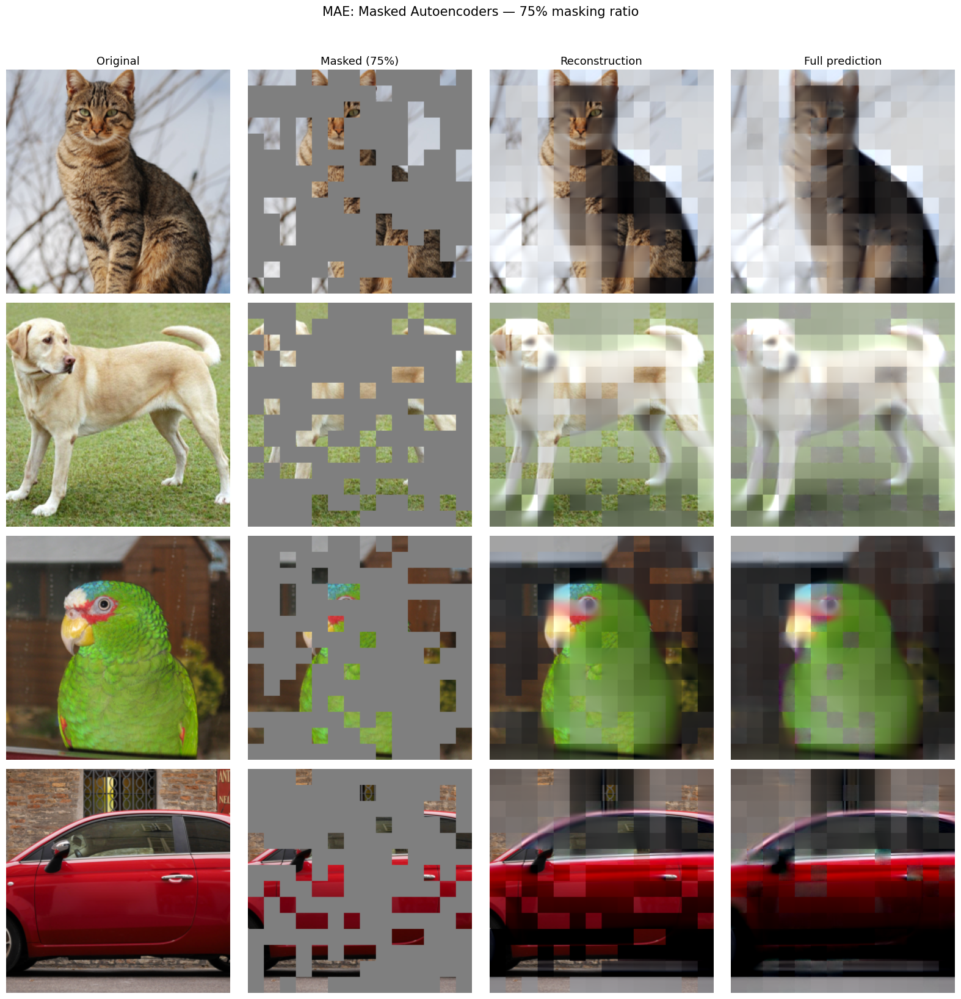

In [47]:
# --- Visualize MAE reconstruction at 75% masking (default) ---

fig, axes = plt.subplots(len(sample_images), 4, figsize=(16, 4 * len(sample_images)))
col_titles = ["Original", "Masked (75%)", "Reconstruction", "Full prediction"]

for row, img in enumerate(sample_images):
    pixel_values, logits, mask = mae_reconstruct(mae_model, mae_processor, img, mask_ratio=0.75)
    original, masked, recon, pred = visualize_mae(pixel_values, logits, mask)

    for col, (image, title) in enumerate(zip([original, masked, recon, pred], col_titles)):
        axes[row, col].imshow(image)
        axes[row, col].axis("off")
        if row == 0:
            axes[row, col].set_title(title, fontsize=13)

fig.suptitle("MAE: Masked Autoencoders — 75% masking ratio", fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

### What to observe

The model reconstructs **semantically plausible** content — it understands the structure of the objects even when 75% of the information is missing.

- The reconstructions are slightly **blurry** because MAE uses an MSE loss, which averages over multiple plausible textures rather than committing to one
- Despite this, the model correctly infers **object structure** (shape of the animal, position of features) and **scene context** (background, lighting)
- The "full prediction" column shows that the model even makes reasonable predictions for *visible* patches — it has learned a generative model of images

### A.3 — Effect of masking ratio

How does masking ratio affect reconstruction quality? We compare 25%, 50%, 75%, and 90% masking on the same image.

This experiment illustrates the core design choice of MAE: the task difficulty must be **high enough** to force global understanding, but not so high that it becomes impossible.

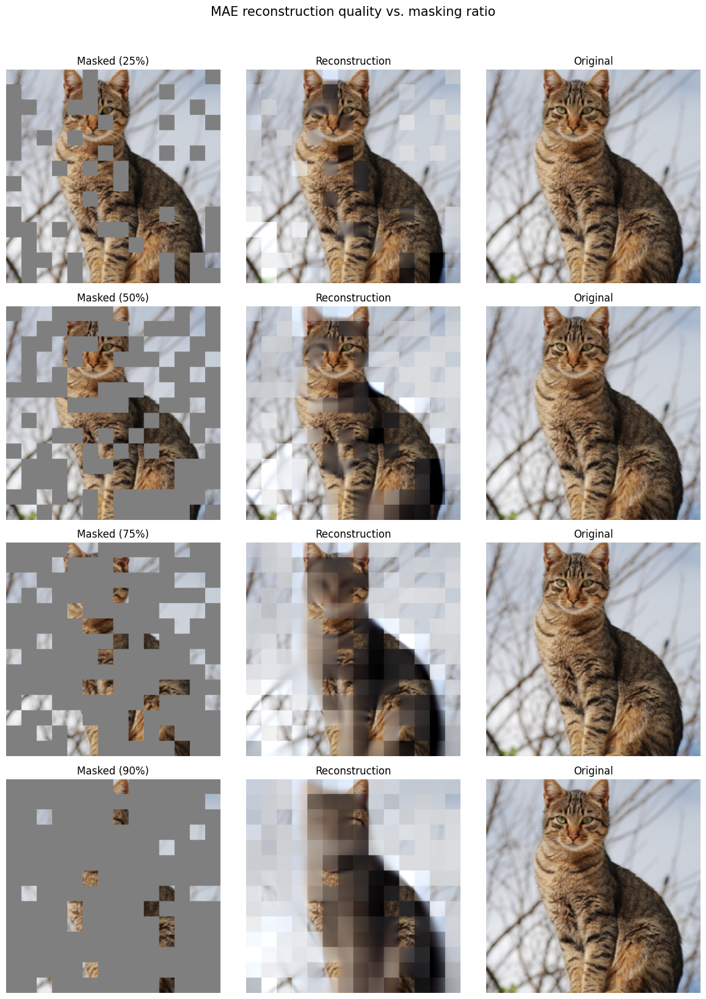

In [48]:
# --- Compare different masking ratios ---

mask_ratios = [0.25, 0.50, 0.75, 0.90]
test_image = sample_images[0]  # Use the first image

fig, axes = plt.subplots(len(mask_ratios), 3, figsize=(12, 4 * len(mask_ratios)))

for row, ratio in enumerate(mask_ratios):
    pixel_values, logits, mask = mae_reconstruct(mae_model, mae_processor, test_image, mask_ratio=ratio)
    original, masked, recon, _ = visualize_mae(pixel_values, logits, mask)

    axes[row, 0].imshow(masked)
    axes[row, 0].set_title(f"Masked ({int(ratio*100)}%)", fontsize=12)
    axes[row, 0].axis("off")

    axes[row, 1].imshow(recon)
    axes[row, 1].set_title("Reconstruction", fontsize=12)
    axes[row, 1].axis("off")

    axes[row, 2].imshow(original)
    axes[row, 2].set_title("Original", fontsize=12)
    axes[row, 2].axis("off")

fig.suptitle("MAE reconstruction quality vs. masking ratio", fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

### What to observe

| Masking ratio | Task difficulty | Reconstruction quality | What the model needs |
|---|---|---|---|
| **25%** | Too easy | Near-perfect | Just interpolate from neighbors |
| **50%** | Moderate | Very good | Some global context needed |
| **75%** | Hard (sweet spot) | Good but blurry | Must understand scene structure |
| **90%** | Very hard | Degraded | Not enough signal to reconstruct |

> **Question for students:** At 90% masking, the reconstruction degrades noticeably. Why? What does this tell us about the trade-off between task difficulty and learnability? Think about how this relates to the rotation vs. jigsaw comparison from Notebook 1.

### A.4 — Linear probing on CIFAR-10

MAE reconstructions look impressive — but does the encoder actually learn **useful representations** for downstream tasks?

Let's find out with the same evaluation protocol from Notebooks 1 & 2:
1. **Freeze** the MAE encoder (no gradient updates)
2. **Extract** CLS token features for CIFAR-10 images
3. **Fit** a logistic regression on top
4. **Report** test accuracy

> **Note:** We pass `noise=zeros` to the encoder to disable masking during feature extraction — we want the encoder to see all patches.

In [49]:
# --- Extract MAE encoder features on CIFAR-10 ---
# Reuse the mae_model already loaded (ViTMAEForPreTraining) — just use its .vit encoder

mae_encoder = mae_model.vit  # the ViT encoder inside the full MAE model
mae_encoder.eval()

# MAE needs 224x224 — resize CIFAR-10
mae_eval_transform = T.Compose([
    T.Resize(224),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

cifar10_train_mae = torchvision.datasets.CIFAR10(
    root="./data", train=True, download=True, transform=mae_eval_transform
)
cifar10_test_mae = torchvision.datasets.CIFAR10(
    root="./data", train=False, download=True, transform=mae_eval_transform
)

# Use subsets for speed (same sizes as DINOv2 section later)
TRAIN_SUBSET = 5000
TEST_SUBSET = 1000

train_loader_mae = DataLoader(
    torch.utils.data.Subset(cifar10_train_mae, range(TRAIN_SUBSET)),
    batch_size=64, shuffle=False, num_workers=0,
)
test_loader_mae = DataLoader(
    torch.utils.data.Subset(cifar10_test_mae, range(TEST_SUBSET)),
    batch_size=64, shuffle=False, num_workers=0,
)


@torch.no_grad()
def extract_mae_features(encoder, loader):
    """Extract CLS token features from MAE encoder (no masking)."""
    encoder.eval()
    all_feats, all_labels = [], []
    for images, labels in tqdm(loader, desc="Extracting MAE features"):
        # noise=zeros ensures deterministic patch ordering (no masking)
        outputs = encoder(images.to(device), noise=torch.zeros(images.shape[0], 196, device=device))
        # CLS token is the first token in last_hidden_state
        cls_feats = outputs.last_hidden_state[:, 0, :]  # (B, 768)
        all_feats.append(cls_feats.cpu().numpy())
        all_labels.append(labels.numpy())
    return np.concatenate(all_feats), np.concatenate(all_labels)


print("Extracting MAE features from CIFAR-10...")
mae_train_feats, mae_train_labels = extract_mae_features(mae_encoder, train_loader_mae)
mae_test_feats, mae_test_labels = extract_mae_features(mae_encoder, test_loader_mae)
print(f"Train features: {mae_train_feats.shape} | Test features: {mae_test_feats.shape}")

Extracting MAE features from CIFAR-10...


Extracting MAE features:   0%|          | 0/79 [00:00<?, ?it/s]

Extracting MAE features:   0%|          | 0/16 [00:00<?, ?it/s]

Train features: (5000, 768) | Test features: (1000, 768)


In [50]:
# --- MAE linear probe ---

def train_linear_probe(train_feats, train_labels, test_feats, test_labels):
    """Fit a logistic regression on pre-extracted features. Returns test accuracy."""
    clf = LogisticRegression(max_iter=1000, C=1.0, solver="lbfgs", multi_class="multinomial")
    clf.fit(train_feats, train_labels)
    return clf.score(test_feats, test_labels)


mae_acc = train_linear_probe(mae_train_feats, mae_train_labels,
                             mae_test_feats, mae_test_labels)

print(f"\n{'Method':<35s} {'CIFAR-10 Accuracy':>20s}")
print("-" * 57)
print(f"{'Random (NB1)':<35s} {'~28%':>20s}")
print(f"{'Rotation pretext (NB1)':<35s} {'~55%':>20s}")
print(f"{'SimCLR 20ep (NB2)':<35s} {'~67%':>20s}")
print(f"{'MAE linear probe (frozen)':<35s} {f'{mae_acc*100:.1f}%':>20s}")

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



Method                                 CIFAR-10 Accuracy
---------------------------------------------------------
Random (NB1)                                        ~28%
Rotation pretext (NB1)                              ~55%
SimCLR 20ep (NB2)                                   ~67%
MAE linear probe (frozen)                          56.5%


In [ ]:
# --- t-SNE visualization of MAE features ---

def plot_tsne(feats, labels, title, n_samples=1000):
    """Run t-SNE on pre-extracted features and plot colored scatter."""
    if len(feats) > n_samples:
        indices = np.random.choice(len(feats), n_samples, replace=False)
        feats = feats[indices]
        labels = labels[indices]

    print(f"Running t-SNE on {len(feats)} samples...")
    tsne = TSNE(n_components=2, perplexity=30, random_state=SEED, n_iter=1000)
    emb = tsne.fit_transform(feats)
    print("Done!")

    fig, ax = plt.subplots(figsize=(10, 8))
    cmap = plt.cm.tab10
    for class_idx in range(10):
        mask = labels == class_idx
        ax.scatter(emb[mask, 0], emb[mask, 1], c=[cmap(class_idx)],
                   label=CIFAR10_CLASSES[class_idx], s=12, alpha=0.6)
    ax.legend(fontsize=9, markerscale=3, loc="best")
    ax.set_title(f"t-SNE of {title} features (colored by class)", fontsize=13)
    ax.set_xlabel("t-SNE dim 1")
    ax.set_ylabel("t-SNE dim 2")
    plt.tight_layout()
    plt.show()


plot_tsne(mae_test_feats, mae_test_labels, "MAE (frozen encoder)")

### MAE evaluation — What to observe

> **Expected result:** MAE linear probe should reach ~60-70% on CIFAR-10. This is decent but not spectacular.

Why? MAE's training objective is **pixel reconstruction**, which prioritizes local texture and spatial structure over global semantic features. The CLS token is less optimized for classification compared to contrastive or self-distillation methods.

MAE's true strength lies in **dense prediction tasks** (segmentation, depth estimation) where local patch-level understanding matters more than global classification.

> Compare the t-SNE plot with what you saw in Notebook 2 (SimCLR): MAE features should show some class structure, but with more overlap between clusters. We'll see in Part B that DINOv2, which explicitly optimizes for global features via self-distillation, significantly outperforms MAE on this linear probe benchmark.

---
## Part B — DINOv2

### A different approach to SSL

While MAE learns by **reconstructing pixels**, DINOv2 (Oquab et al., 2023) learns via **self-distillation**: a student ViT is trained to match the output distribution of a teacher network (an exponential moving average of the student).

$$\text{Student}(\text{local crops}) \approx \text{Teacher}(\text{global crops})$$

### Why self-distillation works

The key innovation is the **multi-crop strategy**:
- The **teacher** sees large, global crops (covering most of the image)
- The **student** sees smaller, local crops

By training the student to match the teacher's output, the model learns that local parts of an image should produce representations **consistent with** the global view. This forces **local-to-global correspondence** — a very powerful inductive bias.

### DINOv2's emergent properties

The result is a model with remarkable properties that were never explicitly trained:

| Property | Description |
|---|---|
| **Attention maps** | Self-attention heads segment objects without segmentation training |
| **Patch features** | Patch-level embeddings cluster by semantic meaning |
| **k-NN classification** | Frozen features achieve near-supervised accuracy with no training |
| **Dense prediction** | Features transfer to segmentation, depth estimation, etc. |

Let's explore these properties one by one.

### B.1 — Load pre-trained DINOv2

We use `dinov2_vits14` — a ViT-Small with patch size 14, loaded directly from the Facebook Research PyTorch Hub.

In [51]:
# --- Load DINOv2 ViT-Small ---

dinov2 = torch.hub.load("facebookresearch/dinov2", "dinov2_vits14").to(device)
dinov2.eval()

print(f"DINOv2 ViT-S/14 loaded: {sum(p.numel() for p in dinov2.parameters()) / 1e6:.1f}M parameters")
print(f"Patch size: 14")
print(f"Embedding dim: {dinov2.embed_dim}")
print(f"Number of heads: {dinov2.num_heads}")

Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


DINOv2 ViT-S/14 loaded: 22.1M parameters
Patch size: 14
Embedding dim: 384
Number of heads: 6


In [52]:
# --- DINOv2 preprocessing ---

dinov2_transform = T.Compose([
    T.Resize(252),       # Make divisible by patch_size=14 → 252 / 14 = 18 patches per side
    T.CenterCrop(252),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

PATCH_SIZE = 14
IMAGE_SIZE = 252
NUM_PATCHES_SIDE = IMAGE_SIZE // PATCH_SIZE  # 18
print(f"Input: {IMAGE_SIZE}x{IMAGE_SIZE} → {NUM_PATCHES_SIDE}x{NUM_PATCHES_SIDE} = {NUM_PATCHES_SIDE**2} patches")

Input: 252x252 → 18x18 = 324 patches


### B.2 — Attention map visualization

DINO/DINOv2's most striking emergent property: the self-attention maps of the **[CLS] token** in the last transformer layer naturally segment objects — **without any segmentation training**.

We extract the attention weights from the last layer and visualize what each head attends to. The [CLS] token's attention to patch tokens reveals which parts of the image the model considers most important for building the global representation.

$$\text{Attention}_{h}(i, j) = \text{softmax}\left(\frac{\mathbf{q}_i^{(h)} \cdot \mathbf{k}_j^{(h)}}{\sqrt{d_k}}\right)$$

We visualize $\text{Attention}_{h}(\text{CLS}, \text{patch}_j)$ for each head $h$.

In [53]:
# --- Extract attention maps from the last layer ---

def get_attention_maps(model, pil_image, transform):
    """Extract CLS-token attention maps from the last transformer layer."""
    x = transform(pil_image).unsqueeze(0).to(device)  # (1, 3, 252, 252)

    # Hook into the last attention layer
    attention_maps = []

    def hook_fn(module, input, output):
        # output is a tuple; we need the attention weights
        # For DINOv2, we use get_intermediate_layers or register a hook
        pass

    # Use DINOv2's built-in method to get attention
    with torch.no_grad():
        # Get attention from last block
        # DINOv2 blocks: each has attn module
        last_block = model.blocks[-1]
        attn_module = last_block.attn

        # Register hook to capture attention weights
        attn_weights = []

        def attn_hook(module, input, output):
            # Recompute attention to get weights
            B, N, C = input[0].shape
            qkv = module.qkv(input[0]).reshape(B, N, 3, module.num_heads, C // module.num_heads)
            qkv = qkv.permute(2, 0, 3, 1, 4)  # (3, B, heads, N, head_dim)
            q, k, v = qkv.unbind(0)
            scale = (C // module.num_heads) ** -0.5
            attn = (q @ k.transpose(-2, -1)) * scale
            attn = attn.softmax(dim=-1)  # (B, heads, N, N)
            attn_weights.append(attn.cpu())

        handle = attn_module.register_forward_hook(attn_hook)
        _ = model(x)
        handle.remove()

    # attn_weights[0] shape: (1, num_heads, num_tokens, num_tokens)
    # CLS token is token 0; get its attention to all patch tokens
    attn = attn_weights[0].squeeze(0)  # (num_heads, N, N)
    cls_attn = attn[:, 0, 1:]  # (num_heads, num_patches) — CLS attending to patches

    return cls_attn  # (num_heads, num_patches)

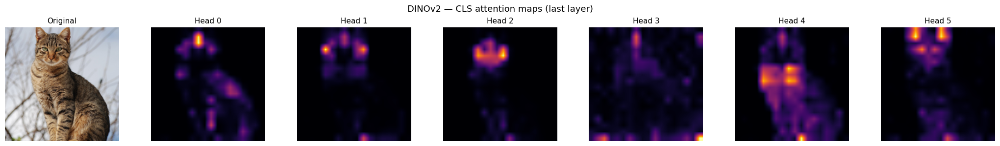

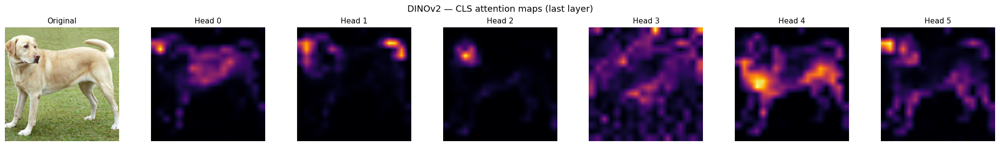

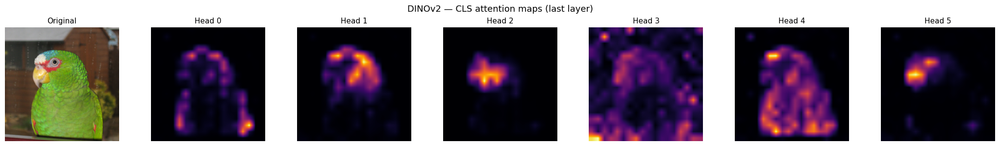

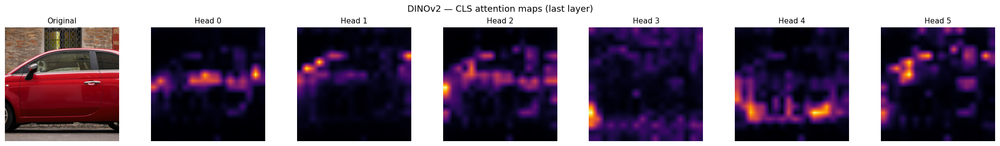

In [54]:
# --- Visualize attention maps for each head ---

for img_idx, pil_img in enumerate(sample_images):
    cls_attn = get_attention_maps(dinov2, pil_img, dinov2_transform)
    num_heads = cls_attn.shape[0]

    # Show original + 6 attention heads
    n_show = min(6, num_heads)
    fig, axes = plt.subplots(1, n_show + 1, figsize=(3 * (n_show + 1), 3))

    # Original image
    display_img = pil_img.resize((IMAGE_SIZE, IMAGE_SIZE))
    axes[0].imshow(display_img)
    axes[0].set_title("Original", fontsize=11)
    axes[0].axis("off")

    for h in range(n_show):
        attn_map = cls_attn[h].reshape(NUM_PATCHES_SIDE, NUM_PATCHES_SIDE).numpy()
        axes[h + 1].imshow(attn_map, cmap="inferno", interpolation="bilinear")
        axes[h + 1].set_title(f"Head {h}", fontsize=11)
        axes[h + 1].axis("off")

    fig.suptitle(f"DINOv2 — CLS attention maps (last layer)", fontsize=13)
    plt.tight_layout()
    plt.show()

### What to observe

Different heads attend to different semantic regions:
- Some focus on the **foreground object** (the animal, the car)
- Others attend to the **background** or **object boundaries**
- Some capture **fine details** while others capture **coarse structure**

This is the "emergent segmentation" property discussed in the lecture: the model develops object-level understanding purely from self-supervised training.

> **Question for students:** Why do you think ViTs develop this property under DINO training but not under standard supervised training? Think about what the multi-crop strategy (local → global correspondence) encourages that classification loss does not.

### B.3 — Attention-based foreground segmentation

We can combine attention heads to create a rough **foreground mask** — no segmentation labels needed.

The procedure is simple:
1. **Average** the CLS attention across all heads → one attention map per image
2. **Threshold** at a percentile (e.g., 60th) → binary foreground/background mask
3. **Apply** the mask to the original image

This demonstrates that DINOv2's attention contains enough information for coarse segmentation — a property that emerges from the self-distillation objective, not from any explicit segmentation supervision.

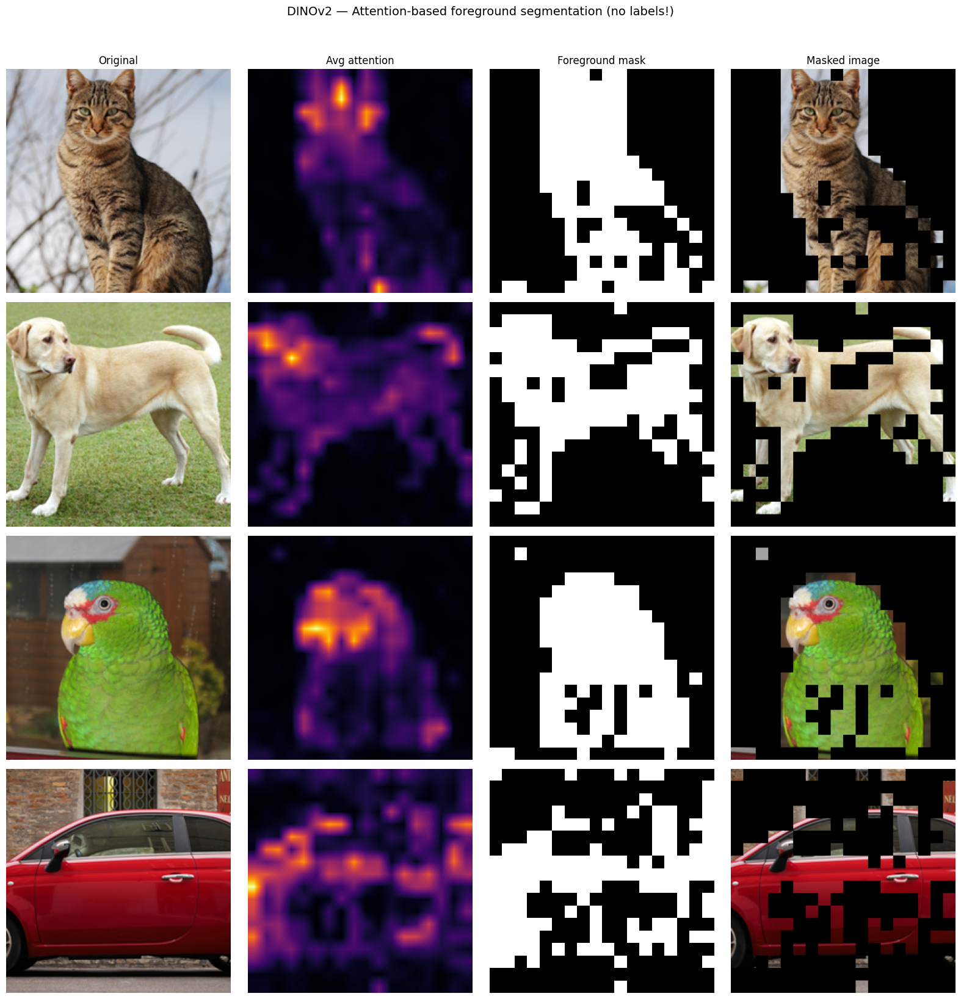

In [55]:
# --- Foreground segmentation from attention ---

def attention_segmentation(cls_attn, threshold_percentile=60):
    """Create a foreground mask by averaging attention heads and thresholding."""
    # Average across heads
    avg_attn = cls_attn.mean(dim=0)  # (num_patches,)
    attn_map = avg_attn.reshape(NUM_PATCHES_SIDE, NUM_PATCHES_SIDE).numpy()

    # Threshold
    threshold = np.percentile(attn_map, threshold_percentile)
    fg_mask = (attn_map > threshold).astype(float)

    return attn_map, fg_mask


fig, axes = plt.subplots(len(sample_images), 4, figsize=(16, 4 * len(sample_images)))
col_titles = ["Original", "Avg attention", "Foreground mask", "Masked image"]

for row, pil_img in enumerate(sample_images):
    cls_attn = get_attention_maps(dinov2, pil_img, dinov2_transform)
    attn_map, fg_mask = attention_segmentation(cls_attn)

    display_img = np.array(pil_img.resize((IMAGE_SIZE, IMAGE_SIZE))) / 255.0

    # Upscale mask to image size
    fg_mask_up = np.kron(fg_mask, np.ones((PATCH_SIZE, PATCH_SIZE)))

    axes[row, 0].imshow(display_img)
    axes[row, 1].imshow(attn_map, cmap="inferno", interpolation="bilinear")
    axes[row, 2].imshow(fg_mask, cmap="gray", interpolation="nearest")
    axes[row, 3].imshow(display_img * fg_mask_up[:, :, None])

    for col in range(4):
        axes[row, col].axis("off")
        if row == 0:
            axes[row, col].set_title(col_titles[col], fontsize=12)

fig.suptitle("DINOv2 — Attention-based foreground segmentation (no labels!)", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

### B.4 — PCA on patch features

Another striking property: if we extract **patch-level features** from DINOv2 and project them to 3 dimensions with PCA, semantically similar regions get mapped to similar colors — **across different images**.

This is different from attention maps: here we look at the **feature content** of each patch, not at what the CLS token attends to. The experiment:

1. Extract patch features from DINOv2's last layer for all sample images
2. Fit PCA **jointly** on all patches (so the color mapping is consistent across images)
3. Map the 3 PCA components to RGB channels
4. Display each patch colored by its PCA projection

If the features encode semantic meaning at the patch level, we should see coherent "semantic coloring" — e.g., all background patches get one color, all animal patches get another.

In [56]:
# --- Extract patch features ---

def get_patch_features(model, pil_image, transform):
    """Extract patch-level features from DINOv2 (excluding CLS token)."""
    x = transform(pil_image).unsqueeze(0).to(device)
    with torch.no_grad():
        # Get features from the last layer
        features = model.forward_features(x)
        patch_tokens = features["x_norm_patchtokens"]  # (1, num_patches, embed_dim)
    return patch_tokens.squeeze(0).cpu().numpy()  # (num_patches, embed_dim)


# Extract patch features for all sample images
all_patch_feats = []
for img in sample_images:
    feats = get_patch_features(dinov2, img, dinov2_transform)
    all_patch_feats.append(feats)
    print(f"Patch features shape: {feats.shape}")

# Fit PCA on all patches jointly (so colors are comparable across images)
all_feats_concat = np.concatenate(all_patch_feats, axis=0)
pca = PCA(n_components=3)
pca.fit(all_feats_concat)
print(f"\nPCA explained variance: {pca.explained_variance_ratio_.sum():.2%}")

Patch features shape: (324, 384)
Patch features shape: (324, 384)
Patch features shape: (324, 384)
Patch features shape: (324, 384)

PCA explained variance: 24.96%


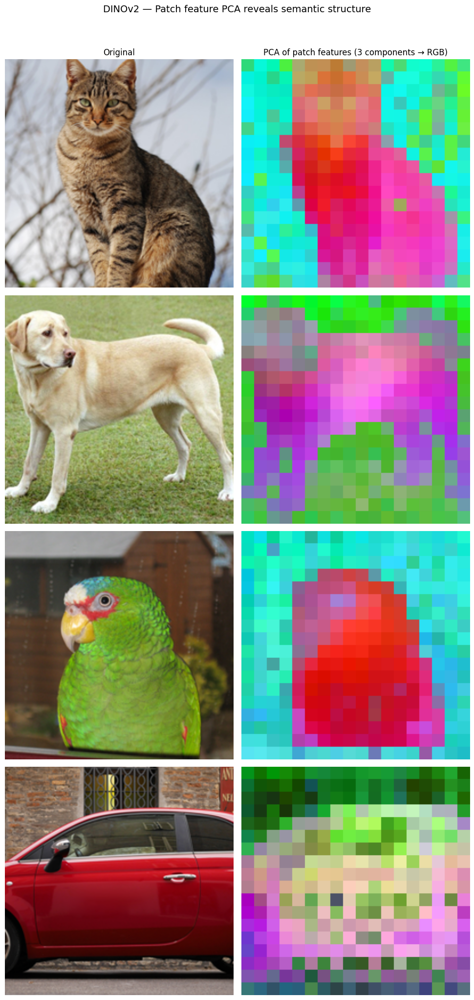

In [57]:
# --- Visualize PCA of patch features ---

fig, axes = plt.subplots(len(sample_images), 2, figsize=(10, 5 * len(sample_images)))

for row, (pil_img, feats) in enumerate(zip(sample_images, all_patch_feats)):
    # Project to 3D
    pca_feats = pca.transform(feats)  # (num_patches, 3)

    # Normalize each component to [0, 1] for RGB display
    pca_min = pca_feats.min(axis=0)
    pca_max = pca_feats.max(axis=0)
    pca_rgb = (pca_feats - pca_min) / (pca_max - pca_min + 1e-8)

    # Reshape to spatial grid
    pca_image = pca_rgb.reshape(NUM_PATCHES_SIDE, NUM_PATCHES_SIDE, 3)

    # Original
    axes[row, 0].imshow(pil_img.resize((IMAGE_SIZE, IMAGE_SIZE)))
    axes[row, 0].set_title("Original" if row == 0 else "", fontsize=12)
    axes[row, 0].axis("off")

    # PCA visualization (upscale for display)
    pca_upscaled = np.kron(pca_image, np.ones((PATCH_SIZE, PATCH_SIZE, 1)))
    axes[row, 1].imshow(pca_upscaled)
    axes[row, 1].set_title("PCA of patch features (3 components → RGB)" if row == 0 else "", fontsize=12)
    axes[row, 1].axis("off")

fig.suptitle("DINOv2 — Patch feature PCA reveals semantic structure", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

### What to observe

Patches belonging to the same semantic region (e.g., the animal's body, the background grass) get similar PCA colors — **even across different images**.

This means DINOv2 patch features encode **semantic meaning at the patch level**, not just texture or low-level appearance. This is the property that makes DINOv2 features so effective for **dense prediction tasks** (segmentation, depth estimation) without any task-specific fine-tuning.

> Compare this with what you know about MAE: MAE's training objective is pixel reconstruction, which focuses on local texture. DINOv2's self-distillation objective encourages global-local consistency, which produces semantically richer patch features.

### B.5 — k-NN classification (no fine-tuning)

One of the most impressive results from DINOv2: a simple **k-nearest-neighbors classifier** on frozen features achieves strong accuracy — **no linear probe needed, no training at all**.

This is a much stronger test than linear probing:
- **Linear probe**: fits a linear model on features → tests linear separability
- **k-NN**: just computes distances → tests whether **same-class images are closest neighbors** in feature space

If k-NN works well, it means the feature space has exceptional **geometric structure**: images of the same class form tight, well-separated clusters.

We use $k=20$ with cosine distance, following the DINOv2 paper's protocol.

In [58]:
# --- Extract DINOv2 CLS features for CIFAR-10 ---

# We resize CIFAR-10 images to 252x252 for DINOv2
cifar10_dinov2_transform = T.Compose([
    T.Resize(252),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

cifar10_train = torchvision.datasets.CIFAR10(
    root="./data", train=True, download=True, transform=cifar10_dinov2_transform
)
cifar10_test = torchvision.datasets.CIFAR10(
    root="./data", train=False, download=True, transform=cifar10_dinov2_transform
)

# Use a subset for speed (5000 train, 1000 test)
TRAIN_SUBSET = 5000
TEST_SUBSET = 1000

train_loader = DataLoader(
    torch.utils.data.Subset(cifar10_train, range(TRAIN_SUBSET)),
    batch_size=64, shuffle=False, num_workers=0,
)
test_loader = DataLoader(
    torch.utils.data.Subset(cifar10_test, range(TEST_SUBSET)),
    batch_size=64, shuffle=False, num_workers=0,
)


@torch.no_grad()
def extract_dinov2_features(model, loader):
    """Extract CLS token features from DINOv2."""
    model.eval()
    all_feats, all_labels = [], []
    for images, labels in tqdm(loader, desc="Extracting DINOv2 features"):
        feats = model(images.to(device))  # CLS token output
        all_feats.append(feats.cpu().numpy())
        all_labels.append(labels.numpy())
    return np.concatenate(all_feats), np.concatenate(all_labels)


print("Extracting DINOv2 features from CIFAR-10...")
train_feats, train_labels = extract_dinov2_features(dinov2, train_loader)
test_feats, test_labels = extract_dinov2_features(dinov2, test_loader)
print(f"Train features: {train_feats.shape} | Test features: {test_feats.shape}")

Extracting DINOv2 features from CIFAR-10...


Extracting DINOv2 features:   0%|          | 0/79 [00:00<?, ?it/s]

Extracting DINOv2 features:   0%|          | 0/16 [00:00<?, ?it/s]

Train features: (5000, 384) | Test features: (1000, 384)


In [59]:
# --- k-NN and Linear Probe evaluation ---

# k-NN (no training, just compute distances) — unique to DINOv2!
knn = KNeighborsClassifier(n_neighbors=20, metric="cosine")
knn.fit(train_feats, train_labels)
knn_acc = knn.score(test_feats, test_labels)

# Linear probe
lp_acc = train_linear_probe(train_feats, train_labels, test_feats, test_labels)

print(f"\n{'Method':<35s} {'CIFAR-10 Accuracy':>20s}")
print("-" * 57)
print(f"{'Random (NB1)':<35s} {'~28%':>20s}")
print(f"{'Rotation pretext (NB1)':<35s} {'~55%':>20s}")
print(f"{'SimCLR 20ep (NB2)':<35s} {'~67%':>20s}")
print(f"{'MAE linear probe (frozen)':<35s} {f'{mae_acc*100:.1f}%':>20s}")
print(f"{'DINOv2 k-NN (frozen, no training!)':<35s} {f'{knn_acc*100:.1f}%':>20s}")
print(f"{'DINOv2 linear probe (frozen)':<35s} {f'{lp_acc*100:.1f}%':>20s}")

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



Method                                 CIFAR-10 Accuracy
---------------------------------------------------------
Random (NB1)                                        ~28%
Rotation pretext (NB1)                              ~55%
SimCLR 20ep (NB2)                                   ~67%
DINOv2 k-NN (frozen, no training!)                 94.7%
DINOv2 linear probe (frozen)                       95.7%


In [ ]:
# --- t-SNE visualization of DINOv2 features ---

plot_tsne(test_feats, test_labels, "DINOv2 (frozen)")

### What to observe

> **Expected results:**
> - DINOv2 k-NN: ~95-97%
> - DINOv2 linear probe: ~97-98%
>
> This is remarkable: a **frozen** DINOv2 model with a simple k-NN — **no training at all** — crushes the representations we trained from scratch in Notebooks 1 and 2.
>
> Of course, this comparison is not entirely fair: DINOv2 was trained on **142M curated images** with a ViT, not a small CNN on 50k CIFAR images. But it demonstrates the power of scaling SSL methods.

> **Question for students:** The k-NN accuracy is very close to the linear probe. What does this tell us about the **geometry** of DINOv2's feature space? Why is this different from, say, the MAE encoder's feature space?

### B.6 — DINOv2 vs. Supervised ViT

To understand what makes DINOv2's representations special, let's compare its attention maps with those of a **supervised ViT** trained on ImageNet classification.

Both models use the same architecture (ViT) and were trained on ImageNet — the only difference is the **training objective**:
- **Supervised ViT:** Cross-entropy classification loss with 1000 class labels
- **DINOv2:** Self-distillation with local-to-global crop consistency (no labels)

If the attention patterns differ, it tells us that the **objective** — not just the architecture — determines what the model learns to attend to.

In [60]:
# --- Load supervised ViT-Small for comparison ---

supervised_vit = torchvision.models.vit_b_16(weights=torchvision.models.ViT_B_16_Weights.IMAGENET1K_V1).to(device)
supervised_vit.eval()

supervised_transform = T.Compose([
    T.Resize(256),
    T.CenterCrop(224),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

SUP_PATCH_SIZE = 16
SUP_IMAGE_SIZE = 224
SUP_PATCHES_SIDE = SUP_IMAGE_SIZE // SUP_PATCH_SIZE  # 14

print(f"Supervised ViT-B/16 loaded: {sum(p.numel() for p in supervised_vit.parameters()) / 1e6:.1f}M parameters")

Supervised ViT-B/16 loaded: 86.6M parameters


In [61]:
# --- Extract attention maps from supervised ViT ---

def get_supervised_vit_attention(model, pil_image, transform):
    """Extract CLS attention maps from the last encoder block of torchvision ViT."""
    x = transform(pil_image).unsqueeze(0).to(device)

    attn_weights = []

    # Hook into the last encoder block's self-attention
    last_block = model.encoder.layers[-1]
    attn_module = last_block.self_attention

    def hook_fn(module, args, output):
        # torchvision's ViT self_attention returns (attn_output, attn_weights)
        attn_weights.append(output[1].detach().cpu())

    # Enable attention weight output
    original_need_weights = True
    handle = attn_module.register_forward_hook(hook_fn)

    # Patch forward to request attention weights
    import types
    original_forward = last_block.forward

    def patched_forward(self, input):
        torch._assert(input.dim() == 3, f"Expected (batch_size, seq_length, hidden_dim) got {input.shape}")
        x = self.ln_1(input)
        x, _ = self.self_attention(x, x, x, need_weights=True, average_attn_weights=False)
        x = self.dropout(x)
        x = x + input
        y = self.ln_2(x)
        y = self.mlp(y)
        return x + y

    last_block.forward = types.MethodType(patched_forward, last_block)

    with torch.no_grad():
        _ = model(x)

    # Restore
    last_block.forward = original_forward
    handle.remove()

    # attn_weights shape: (1, num_heads, N, N)
    attn = attn_weights[0].squeeze(0)  # (num_heads, N, N)
    cls_attn = attn[:, 0, 1:]  # CLS attending to patches
    return cls_attn

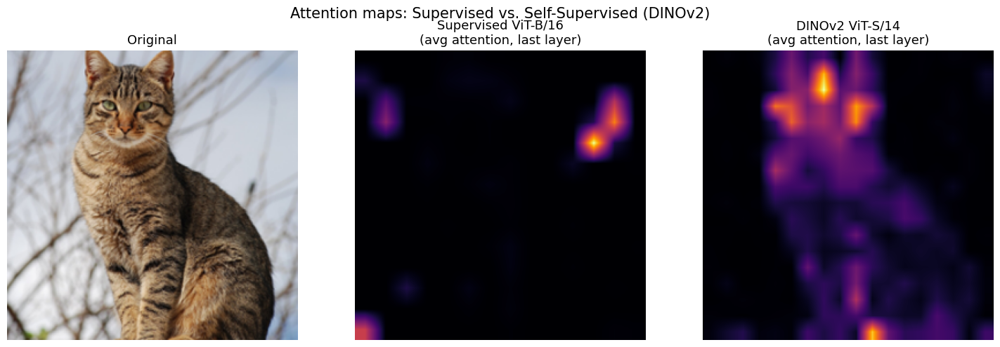

In [62]:
# --- Side-by-side comparison: DINOv2 vs Supervised ViT attention ---

test_img = sample_images[0]

# DINOv2 attention
dino_attn = get_attention_maps(dinov2, test_img, dinov2_transform)
dino_avg = dino_attn.mean(dim=0).reshape(NUM_PATCHES_SIDE, NUM_PATCHES_SIDE).numpy()

# Supervised ViT attention
sup_attn = get_supervised_vit_attention(supervised_vit, test_img, supervised_transform)
sup_avg = sup_attn.mean(dim=0).reshape(SUP_PATCHES_SIDE, SUP_PATCHES_SIDE).numpy()

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(test_img.resize((IMAGE_SIZE, IMAGE_SIZE)))
axes[0].set_title("Original", fontsize=13)
axes[0].axis("off")

axes[1].imshow(sup_avg, cmap="inferno", interpolation="bilinear")
axes[1].set_title("Supervised ViT-B/16\n(avg attention, last layer)", fontsize=13)
axes[1].axis("off")

axes[2].imshow(dino_avg, cmap="inferno", interpolation="bilinear")
axes[2].set_title("DINOv2 ViT-S/14\n(avg attention, last layer)", fontsize=13)
axes[2].axis("off")

fig.suptitle("Attention maps: Supervised vs. Self-Supervised (DINOv2)", fontsize=15)
plt.tight_layout()
plt.show()

### What to observe

| | Supervised ViT | DINOv2 |
|---|---|---|
| **Attention pattern** | Diffuse — spreads across the image | Focused — segments the scene |
| **Why?** | Only needs enough info for classification | Local-global consistency forces patch-level understanding |
| **Object boundaries** | Often blurry | Often sharp and precise |

The supervised ViT's attention is more **diffuse** because it only needs to extract enough information for a classification decision — attending to a few discriminative features is sufficient. DINOv2's attention is more **focused and structured** because the self-distillation objective (local-to-global correspondence) forces the model to understand which patches belong together.

> This is one of the open questions from the lecture: *"Why do ViTs develop segmentation-like attention under DINO but not supervised training?"* The answer lies in the training objective: DINO's multi-crop strategy requires the model to produce consistent representations regardless of which part of the image it sees — and this requires understanding object boundaries.

---
## Summary

### What We Explored

| Model | Experiment | Key Finding |
|---|---|---|
| **MAE** | Masked reconstruction | Reconstructs semantic content, not just texture; 75% masking forces global understanding |
| **MAE** | Masking ratio comparison | Sweet spot at 75% — easier is too trivial, harder degrades quality |
| **MAE** | Linear probe on CIFAR-10 | ~60-70% — decent but not spectacular; MAE's strength is dense prediction, not classification |
| **DINOv2** | Attention maps | Emergent object segmentation without any segmentation training |
| **DINOv2** | Foreground segmentation | Simple thresholding on attention produces usable masks |
| **DINOv2** | PCA on patch features | Semantic clustering at the patch level, consistent across images |
| **DINOv2** | k-NN classification | ~96% on CIFAR-10 with **zero training** — frozen features are remarkably powerful |
| **DINOv2 vs Supervised** | Attention comparison | Self-supervised attention is more structured and object-focused |

---

### The Full Course Arc

| Notebook | Method | CIFAR-10 Accuracy | What We Learned |
|---|---|---|---|
| NB1 | Rotation pretext | ~55% | Hand-designed tasks can learn useful features |
| NB1 | Jigsaw pretext | ~52% | Task difficulty $\neq$ feature quality |
| NB2 | SimCLR (10 ep) | ~67% | Augmentation invariance beats hand-designed tasks |
| **NB3** | **MAE linear probe** | **~65%** | Pixel reconstruction learns structure, not optimal for classification |
| **NB3** | **DINOv2 k-NN** | **~96%** | Self-distillation + scale = near-supervised accuracy with no training |
| **NB3** | **DINOv2 linear probe** | **~97%** | Foundation model features are universally useful |

---

### Key Takeaways

1. **MAE and DINOv2 represent two complementary approaches** to visual SSL:
   - MAE learns by **reconstructing pixels** → strong for dense prediction tasks
   - DINOv2 learns by **self-distillation** → strong for both classification and dense prediction

2. **Emergent properties** are one of the most fascinating aspects of SSL:
   - DINOv2's attention maps segment objects without segmentation training
   - Patch features cluster semantically without any explicit clustering objective
   - These properties emerge from the right combination of architecture (ViT) + objective (self-distillation) + scale (142M images)

3. **The gap between from-scratch and foundation models is massive** — but the **principles are the same**. Everything we learned in Notebooks 1-2 (augmentation invariance, pretext tasks, representation learning, linear probing) directly applies to understanding these larger models.

4. **SSL foundation models produce universally useful features** — classification, segmentation, depth estimation, retrieval — all from the same frozen backbone. This is the promise of self-supervised learning: train once, use everywhere.